In [10]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ============================
# CARREGAR TODOS OS CSVs
# ============================

results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError("Nenhum CSV encontrado na pasta ../results")

dfs = []
for csv in csv_files:
    df_tmp = pd.read_csv(csv)
    df_tmp["source_file"] = csv.name  # opcional: rastrear origem
    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# 🔧 garantir que erro é numérico
df["erro"] = pd.to_numeric(df["erro"], errors="coerce")

# ============================
# ORDENAR MODELOS
# ============================

order = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .index
    .tolist()
)

# ============================
# MAPA DE CORES
# ============================

color_map = {
    "baseline_ultra":  "#EF553B",
    "shape_ultra":  "#EF553B",
    "tail_ultra":  "#EF553B",
    "divergence_ultra": "#EF553B",
    "qderiv_ultra": "#EF553B",
    "baseline_tails_01": "#EF553B",
    "DyS_hellinger": "#fc03d3",
    "DyS_topsoe": "#fc03d3",
    "QuaDapt_DyS": "#fc03d3",
    "baseline_lite": "#19D3F3",
    "mfe": "#19D3F3",
    "qderiv_lite": "#19D3F3",
    "MiniRocket": "#19D3F3",
    "tsfresh": "#19D3F3",
    "catch22": "#19D3F3",
    "divergence_lite": "#19D3F3",
    "tail_lite": "#19D3F3",
    "shape_lite": "#19D3F3"
}

# ============================
# PLOT
# ============================

fig = px.box(
    df,
    x="modelo",
    y="erro",
    category_orders={"modelo": order},
    points="all",
    color="modelo",
    color_discrete_map=color_map
)

fig.update_traces(
    jitter=0.35,
    marker=dict(size=4, opacity=0.6),
)

fig.update_layout(
    title="Comparação de erro entre modelos (ordenado do melhor ao pior)",
    xaxis_title="Modelo",
    yaxis_title="Erro absoluto |prev_pred − prev_real|",
    template="simple_white",
    width=950,
    height=450,
    showlegend=True
)

fig

In [11]:
import pandas as pd
import plotly.express as px
from pathlib import Path

# ============================
# CARREGAR TODOS OS CSVs
# ============================

results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError(
        "Nenhum CSV encontrado"
    )

dfs = []

for csv in csv_files:

    df_tmp = pd.read_csv(csv)

    df_tmp["source_file"] = csv.name

    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# ============================
# LIMPEZA
# ============================

df["erro"] = pd.to_numeric(
    df["erro"],
    errors="coerce"
)

# ============================
# AGRUPAR TODOS OS MOSS
# ============================

df["grupo_modelo"] = df["modelo"]

df.loc[
    df["modelo"].str.contains(
        "MoSS",
        case=False,
        na=False
    ),
    "grupo_modelo"
] = "MoSS"

# ============================
# ORDEM DOS GRUPOS
# ============================

order = (
    df.groupby("grupo_modelo")["erro"]
    .median()
    .sort_values()
    .index
    .tolist()
)

# ============================
# CORES
# ============================

color_map = {
    "MoSS": "#19D3F3",
    "EMQ_BCTS": "#EF553B",
    "ClusterQuant": "#AB63FA"
}

# ============================
# PLOT
# ============================

fig = px.box(
    df,
    x="grupo_modelo",
    y="erro",
    color="grupo_modelo",
    category_orders={
        "grupo_modelo": order
    },
    color_discrete_map=color_map,
    points="all"
)

fig.update_traces(
    jitter=0.35,
    marker=dict(
        size=4,
        opacity=0.5
    )
)

fig.update_layout(
    title=(
        "Comparação entre grupos de modelos"
    ),
    xaxis_title="Grupo",
    yaxis_title=(
        "Erro absoluto |prev_pred − prev_real|"
    ),
    template="simple_white",
    width=900,
    height=500,
    showlegend=False
)

fig.show()

# ============================
# SALVAR HTML
# ============================

#fig.write_html(
#    "comparacao_grupos.html"
#)

print(
    "✅ HTML salvo em comparacao_grupos.html"
)

✅ HTML salvo em comparacao_grupos.html


In [12]:
# ============================
# TABELA DE MEDIANAS
# ============================

tabela_mediana = (
    df.groupby(
        ["dataset", "grupo_modelo"]
    )["erro"]
    .median()
    .reset_index()
)

# pivotar para ficar bonito
tabela_mediana = tabela_mediana.pivot(
    index="dataset",
    columns="grupo_modelo",
    values="erro"
)

# ordenar datasets pela melhor mediana do MoSS
if "MoSS" in tabela_mediana.columns:
    tabela_mediana = tabela_mediana.sort_values(
        by="MoSS"
    )

print("\n===== MEDIANA POR DATASET =====\n")

print(
    tabela_mediana.round(4)
)

# salvar CSV
#tabela_mediana.to_csv(
#    "medianas_por_dataset.csv"
#)

print(
    "\n✅ Tabela salva em medianas_por_dataset.csv"
)


===== MEDIANA POR DATASET =====

grupo_modelo          AC      CC     EMQ  EMQ_BCTS      FM  KDEyCS  KDEyHD  \
dataset                                                                      
letter            0.0392  0.0380  0.0409    0.0411  0.0314  0.0395  0.0399   
isolet            0.0378  0.0365  0.0424    0.0425  0.0298  0.0381  0.0382   
chess             0.0594  0.0485  0.0590    0.0592  0.0527  0.0584  0.0581   
hand_digits       0.0574  0.0572  0.0587    0.0588  0.0624  0.0584  0.0582   
digits            0.0638  0.0636  0.0711    0.0720  0.0637  0.0644  0.0652   
shuttle           0.0073  0.0350  0.0095    0.0095  0.0271  0.0082  0.0084   
abalone           0.0966  0.0785  0.0779    0.0786  0.1264  0.0781  0.0844   
poker_hand        0.1935  0.1935  0.1556    0.1545  0.1825  0.1069  0.1232   
nursery           0.0768  0.0850  0.0883    0.0887  0.1180  0.0714  0.0723   
dry-bean          0.0774  0.0740  0.0793    0.0792  0.0787  0.0784  0.0793   
obesity           0.0845  0.08

In [13]:
import pandas as pd
import plotly.express as px

# =========================================================
# LOAD
# =========================================================
results_path = Path("")

csv_files = list(results_path.glob("*.csv"))

if not csv_files:
    raise FileNotFoundError("Nenhum CSV encontrado na pasta ../results")

dfs = []
for csv in csv_files:
    df_tmp = pd.read_csv(csv)
    df_tmp["source_file"] = csv.name  # opcional: rastrear origem
    dfs.append(df_tmp)

df = pd.concat(dfs, ignore_index=True)

# 🔧 garantir que erro é numérico
df["erro"] = pd.to_numeric(df["erro"], errors="coerce")

# =========================================================
# AGREGAÇÃO (modelo × dataset)
# 👉 troque mean por median se quiser
# =========================================================
df_agg = (
    df
    .groupby(["modelo", "dataset"], as_index=False)
    .agg(erro_mean=("erro", "mean"))
)

# =========================================================
# ORDEM DOS MODELOS (melhor → pior)
# =========================================================
order = (
    df_agg
    .groupby("modelo")["erro_mean"]
    .median()
    .sort_values()
    .index
    .tolist()
)


# =========================================================
# LINEPLOT
# =========================================================
fig = px.line(
    df_agg,
    x="dataset",
    y="erro_mean",
    color="modelo",
    category_orders={"modelo": order},
    markers=True
)

fig.update_layout(
    title="Erro médio por dataset (lineplot)",
    xaxis_title="Dataset",
    yaxis_title="Erro médio |prev_pred − prev_real|",
    template="simple_white",
    width=1100,
    height=500,
)

fig.update_traces(
    marker=dict(size=6),
    line=dict(width=2)
)

fig


===== CSV LOADED =====
    dataset    modelo  n_classes_original      erro
0  dry-bean       EMQ                   7  0.034203
1  dry-bean  EMQ_BCTS                   7  0.033709
2  dry-bean        CC                   7  0.033714
3  dry-bean       PCC                   7  0.033501
4  dry-bean        AC                   7  0.031620

===== MODELOS APÓS AGRUPAMENTO =====
['AC', 'CC', 'EMQ', 'EMQ_BCTS', 'FM', 'KDEyCS', 'KDEyHD', 'KDEyML', 'MoSS_BASE', 'MoSS_ISO_CALIBRATED', 'MoSS_RF_CALIBRATED', 'PAC', 'PCC', 'PWK']

===== MODELOS RESTANTES =====
['AC', 'CC', 'EMQ', 'EMQ_BCTS', 'FM', 'KDEyCS', 'KDEyHD', 'KDEyML', 'MoSS_BASE', 'MoSS_ISO_CALIBRATED', 'MoSS_RF_CALIBRATED', 'PAC', 'PCC', 'PWK']

===== AVERAGE RANK =====
                 modelo  rank_dataset
0                   PCC      4.416667
1                   PWK      4.416667
2                    CC      6.895833
3                KDEyML      6.916667
4   MoSS_ISO_CALIBRATED      6.916667
5             MoSS_BASE      7.166667
6        

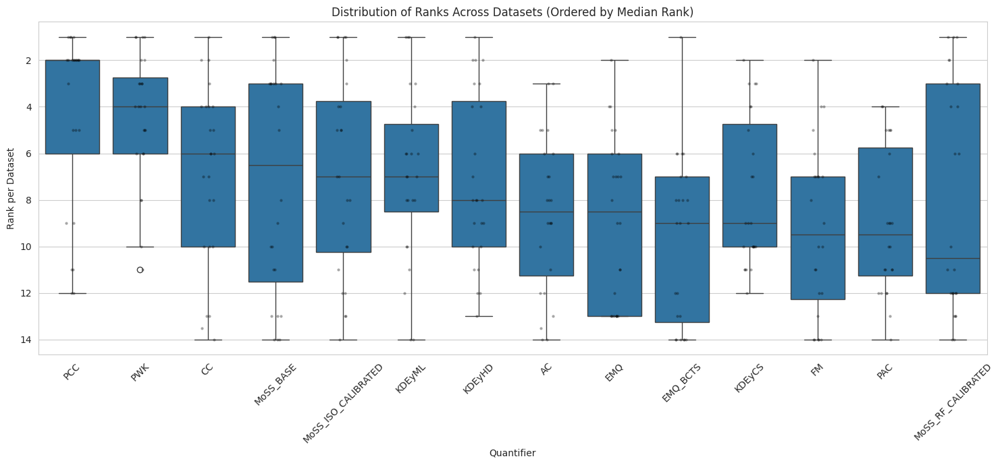

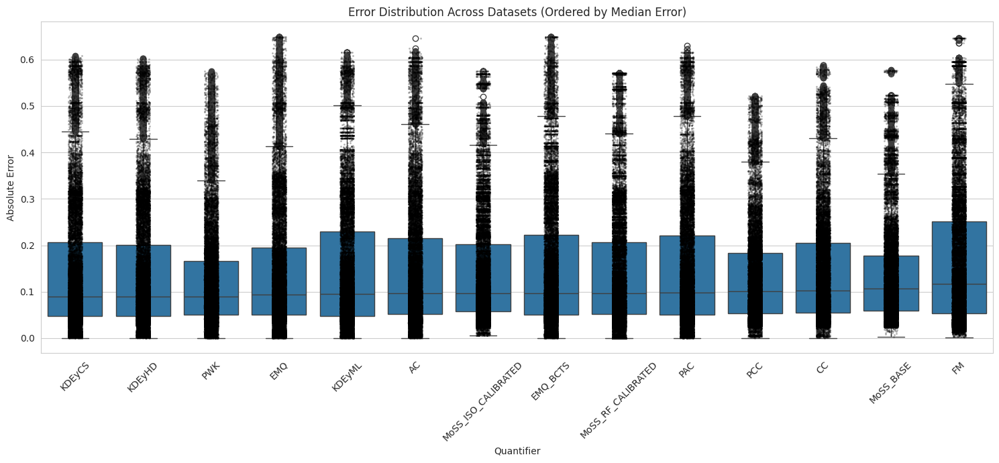


===== GLOBAL MEAN ERROR =====
                 modelo  mean_error
0                   PWK    0.123571
1                   PCC    0.131267
2             MoSS_BASE    0.139273
3                KDEyHD    0.139621
4    MoSS_RF_CALIBRATED    0.139937
5                KDEyCS    0.141634
6   MoSS_ISO_CALIBRATED    0.141762
7                    CC    0.142910
8                   EMQ    0.144195
9                   PAC    0.149278
10                   AC    0.149691
11               KDEyML    0.149710
12             EMQ_BCTS    0.152198
13                   FM    0.167230

===== GLOBAL MEDIAN ERROR =====
                 modelo  median_error
0                KDEyCS      0.089066
1                KDEyHD      0.089387
2                   PWK      0.090286
3                   EMQ      0.094372
4                KDEyML      0.094754
5                    AC      0.096669
6   MoSS_ISO_CALIBRATED      0.096678
7              EMQ_BCTS      0.096707
8    MoSS_RF_CALIBRATED      0.096761
9               

In [8]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# CONFIG
# ============================================================

CSV_PATH = "exp_results.csv"

# ============================================================
# STYLE
# ============================================================

sns.set_style("whitegrid")

# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv(CSV_PATH)

print("\n===== CSV LOADED =====")
print(df.head())

# ============================================================
# UNIFICAR TODOS OS MOSS
# ============================================================

df["modelo"] = df["modelo"].replace(
    {
        r"MoSS_BASE_\d+": "MoSS_BASE",
        r"MoSS_ISO_CALIBRATED_\d+": "MoSS_ISO_CALIBRATED",
        r"MoSS_RF_CALIBRATED_\d+": "MoSS_RF_CALIBRATED",
    },
    regex=True
)

print("\n===== MODELOS APÓS AGRUPAMENTO =====")
print(sorted(df["modelo"].unique()))

# ============================================================
# REMOVER MODELOS ESPECÍFICOS
# ============================================================

modelos_remover = [
    #"KDEyHD",
    #"KDEyCS",
    #"EMQ_BCTS",
    "ClusterQuant"
]

df = df[~df["modelo"].isin(modelos_remover)]

print("\n===== MODELOS RESTANTES =====")
print(sorted(df["modelo"].unique()))

# ============================================================
# MÉDIA POR DATASET
# ============================================================

dataset_mean = (
    df.groupby(["dataset", "modelo"])["erro"]
    .mean()
    .reset_index()
)

# ============================================================
# RANK DENTRO DE CADA DATASET
# ============================================================

dataset_mean["rank_dataset"] = (
    dataset_mean.groupby("dataset")["erro"]
    .rank(method="average")
)

# ============================================================
# AVERAGE RANK FINAL
# ============================================================

avg_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .mean()
    .sort_values()
    .reset_index()
)

print("\n===== AVERAGE RANK =====")
print(avg_rank)

# ============================================================
# SALVAR AVG RANK
# ============================================================

avg_rank.to_csv(
    "average_rank_filtered.csv",
    index=False
)

# ============================================================
# ORDEM PELA MEDIANA DOS RANKS
# ============================================================

ordem_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS RANKS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank
)

sns.stripplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank,
    color="black",
    alpha=0.35,
    size=3
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Rank per Dataset")

plt.title(
    "Distribution of Ranks Across Datasets "
    "(Ordered by Median Rank)"
)

# rank menor = melhor
plt.gca().invert_yaxis()

plt.tight_layout()

#plt.savefig(
#    "rank_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# ORDEM PELA MEDIANA DOS ERROS
# ============================================================

ordem_erro = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS ERROS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro
)

sns.stripplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro,
    color="black",
    alpha=0.30,
    size=2
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Absolute Error")

plt.title(
    "Error Distribution Across Datasets "
    "(Ordered by Median Error)"
)

plt.tight_layout()

#plt.savefig(
#    "error_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# MELHOR MODELO GLOBAL RESTANTE
# ============================================================

global_mean_error = (
    df.groupby("modelo")["erro"]
    .mean()
    .sort_values()
    .reset_index()
)

global_mean_error.columns = [
    "modelo",
    "mean_error"
]

print("\n===== GLOBAL MEAN ERROR =====")
print(global_mean_error)

# ============================================================
# MEDIANA GLOBAL DOS ERROS
# ============================================================

global_median_error = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .reset_index()
)

global_median_error.columns = [
    "modelo",
    "median_error"
]

print("\n===== GLOBAL MEDIAN ERROR =====")
print(global_median_error)

# ============================================================
# SALVAR RESULTADOS
# ============================================================

#global_mean_error.to_csv(
#    "global_mean_error_filtered.csv",
#    index=False
#)

#global_median_error.to_csv(
#    "global_median_error_filtered.csv",
#    index=False
#)

# ============================================================
# RESUMO FINAL
# ============================================================

print("\n✅ ANALYSIS FINISHED")

print("\nArquivos gerados:")

print(" - average_rank_filtered.csv")
print(" - global_mean_error_filtered.csv")
print(" - global_median_error_filtered.csv")

print(" - rank_boxplot_filtered.png")
print(" - error_boxplot_filtered.png")

In [2]:
# ============================================================
# TABELA COMPLETA DE RANKS POR DATASET
# ============================================================

rank_table = dataset_mean.pivot(
    index="dataset",
    columns="modelo",
    values="rank_dataset"
)

rank_table.to_csv(
    "rank_per_dataset_table.csv"
)

print("\n===== RANK TABLE =====")
print(rank_table)


===== RANK TABLE =====
modelo              AC    CC   EMQ  EMQ_BCTS    FM  KDEyCS  KDEyHD  KDEyML  \
dataset                                                                      
abalone           10.0   6.0   5.0       4.0  12.0     7.0     8.0     9.0   
academic-success   7.0  10.0   8.0       9.0  12.0     4.0     3.0     6.0   
chess             12.0   3.0  11.0      10.0   5.0     8.0     7.0     6.0   
cmc                8.0   3.0   4.0       5.0  12.0    10.0     7.0     9.0   
connect-4         10.0  11.0   9.0       8.0  12.0     3.0     5.0     7.0   
digits             7.0   5.0  11.0      12.0   4.0     8.0     9.0     6.0   
dry-bean           8.0   3.0   6.0       9.0  12.0    10.0    11.0     5.0   
hand_digits        5.0   4.0  11.0      12.0   7.0     9.0    10.0     6.0   
hcv                8.0   4.0   5.0      11.0  10.0     7.0     6.0    12.0   
image_seg          5.0   2.0  10.0      11.0   7.0     6.0     8.0     3.0   
isolet             7.0   5.0  11.0      


===== CSV LOADED =====
    dataset    modelo  n_classes_original      erro
0  dry-bean       EMQ                   7  0.034203
1  dry-bean  EMQ_BCTS                   7  0.033709
2  dry-bean        CC                   7  0.033714
3  dry-bean       PCC                   7  0.033501
4  dry-bean        AC                   7  0.031620

Total original datasets: 24

===== MODELOS APÓS AGRUPAMENTO =====
['AC', 'CC', 'EMQ', 'EMQ_BCTS', 'FM', 'KDEyCS', 'KDEyHD', 'KDEyML', 'PAC', 'PCC', 'PWK', 'QMoSS', 'QMoSS_ISO', 'QMoSS_RF']

Total remaining models: 14
modelo
EMQ          24000
EMQ_BCTS     24000
CC           24000
PCC          24000
AC           24000
PAC          24000
FM           24000
KDEyML       24000
KDEyHD       24000
KDEyCS       24000
PWK          24000
QMoSS        24000
QMoSS_ISO    24000
QMoSS_RF     24000
Name: count, dtype: int64

===== MODELOS APÓS AGRUPAMENTO =====
['AC', 'CC', 'EMQ', 'EMQ_BCTS', 'FM', 'KDEyCS', 'KDEyHD', 'KDEyML', 'MoSS_BASE_10', 'MoSS_BASE_11', 'MoSS_BAS

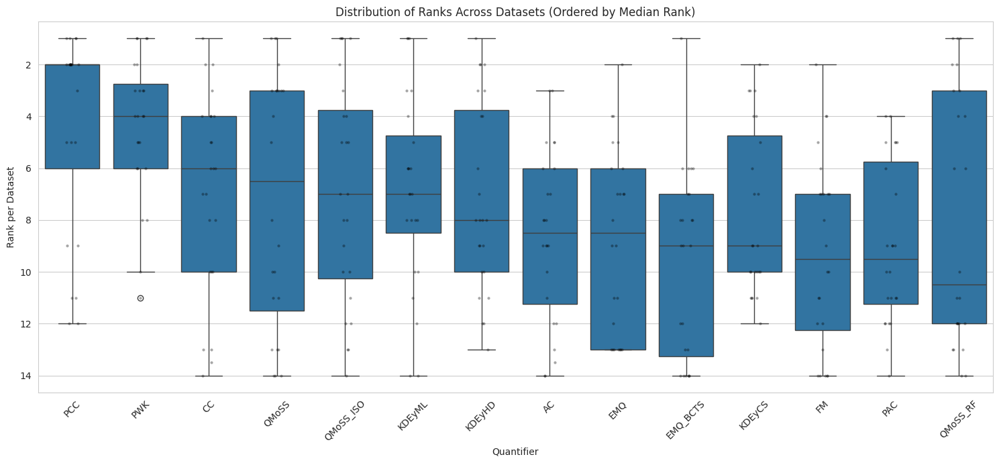

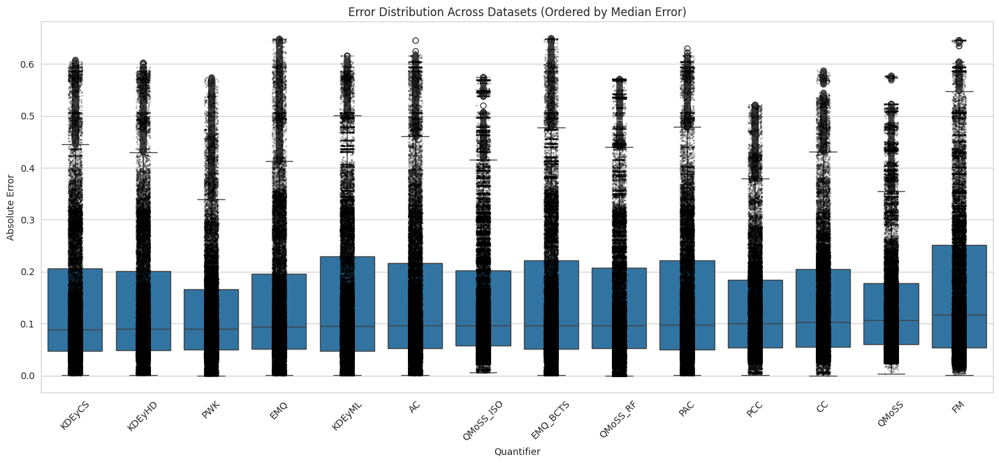


===== GLOBAL MEAN ERROR =====
       modelo  mean_error
0         PWK    0.123571
1         PCC    0.131267
2       QMoSS    0.139273
3      KDEyHD    0.139621
4    QMoSS_RF    0.139937
5      KDEyCS    0.141634
6   QMoSS_ISO    0.141762
7          CC    0.142910
8         EMQ    0.144195
9         PAC    0.149278
10         AC    0.149691
11     KDEyML    0.149710
12   EMQ_BCTS    0.152198
13         FM    0.167230

===== GLOBAL MEDIAN ERROR - Código A =====
       modelo  median_error
0      KDEyCS      0.089066
1      KDEyHD      0.089387
2         PWK      0.090286
3         EMQ      0.094372
4      KDEyML      0.094754
5          AC      0.096669
6   QMoSS_ISO      0.096678
7    EMQ_BCTS      0.096707
8    QMoSS_RF      0.096761
9         PAC      0.097896
10        PCC      0.100443
11         CC      0.102955
12      QMoSS      0.107260
13         FM      0.116645

===== RESULTS TABLE =====
modelo                                     AC        CC       EMQ  EMQ_BCTS  \
dataset  

In [9]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# ============================================================
# CONFIG
# ============================================================

CSV_PATH = "exp_results.csv"

# ============================================================
# STYLE
# ============================================================

sns.set_style("whitegrid")

# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv(CSV_PATH)

print("\n===== CSV LOADED =====")
print(df.head())

# ============================================================
# UNIFICAR TODOS OS MOSS
# ============================================================

df["modelo"] = df["modelo"].replace(
    to_replace=r"MoSS_\d+_CALIBRATED",
    value="MoSS_CALIBRATED",
    regex=True
)

# ============================================================
# DATASETS ORIGINAIS
# ============================================================

all_datasets = sorted(df["dataset"].unique())

print(f"\nTotal original datasets: {len(all_datasets)}")

# ============================================================
# REMOVER MODELOS
# ============================================================

modelos_remover = [
    #"KDEyHD",
    #"KDEyCS",
    #"EMQ_BCTS",
    "ClusterQuant"
]

df_filtered = df[
    ~df["modelo"].isin(modelos_remover)
].copy()

# ============================================================
# UNIFICAR TODOS OS MOSS
# ============================================================

df_filtered["modelo"] = df_filtered["modelo"].replace(
    {
        r"MoSS_BASE_\d+$": "QMoSS",
        r"MoSS_ISO_CALIBRATED_\d+$": "QMoSS_ISO",
        r"MoSS_RF_CALIBRATED_\d+$": "QMoSS_RF",
    },
    regex=True
)

remaining_models = sorted(
    df_filtered["modelo"].unique()
)

print("\n===== MODELOS APÓS AGRUPAMENTO =====")
print(remaining_models)

print(
    f"\nTotal remaining models: "
    f"{len(remaining_models)}"
)
dataset_model_count = (
    df_filtered.groupby("dataset")["modelo"]
    .nunique()
)

valid_datasets = dataset_model_count[
    dataset_model_count == len(remaining_models)
].index
print(df_filtered["modelo"].value_counts())
print("\n===== MODELOS APÓS AGRUPAMENTO =====")
print(sorted(df["modelo"].unique()))

# ============================================================
# GARANTIR DATASETS COMPLETOS
# ============================================================
# Mantém apenas datasets que possuem TODOS os
# modelos restantes
# ============================================================

dataset_model_count = (
    df_filtered.groupby("dataset")["modelo"]
    .nunique()
)

valid_datasets = dataset_model_count[
    dataset_model_count == len(remaining_models)
].index

df = df_filtered[
    df_filtered["dataset"].isin(valid_datasets)
].copy()

print(f"\nDatasets completos restantes: {len(valid_datasets)}")

missing_datasets = set(all_datasets) - set(valid_datasets)

if len(missing_datasets) > 0:
    print("\n⚠️ DATASETS REMOVIDOS (incompletos):")
    for d in sorted(missing_datasets):
        print(d)

# ============================================================
# CHECAGEM FINAL
# ============================================================

final_check = (
    df.groupby("dataset")["modelo"]
    .nunique()
)

assert (final_check == len(remaining_models)).all()

print("\n✅ Todos os datasets possuem todos os modelos restantes.")

# ============================================================
# MÉDIA POR DATASET
# ============================================================

dataset_mean = (
    df.groupby(["dataset", "modelo"])["erro"]
    .mean()
    .reset_index()
)

# ============================================================
# RANK DENTRO DE CADA DATASET
# ============================================================

dataset_mean["rank_dataset"] = (
    dataset_mean.groupby("dataset")["erro"]
    .rank(method="average")
)

# ============================================================
# AVERAGE RANK FINAL
# ============================================================

avg_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .mean()
    .sort_values()
    .reset_index()
)

print("\n===== AVERAGE RANK =====")
print(avg_rank)

# ============================================================
# SALVAR AVG RANK
# ============================================================

#avg_rank.to_csv(
#    "average_rank_filtered.csv",
#    index=False
#)

# ============================================================
# ORDEM PELA MEDIANA DOS RANKS
# ============================================================

ordem_rank = (
    dataset_mean.groupby("modelo")["rank_dataset"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS RANKS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank
)

sns.stripplot(
    data=dataset_mean,
    x="modelo",
    y="rank_dataset",
    order=ordem_rank,
    color="black",
    alpha=0.35,
    size=3
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Rank per Dataset")

plt.title(
    "Distribution of Ranks Across Datasets "
    "(Ordered by Median Rank)"
)

# rank menor = melhor
plt.gca().invert_yaxis()

plt.tight_layout()

#plt.savefig(
#    "rank_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# ORDEM PELA MEDIANA DOS ERROS
# ============================================================

ordem_erro = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .index
)

# ============================================================
# BOXPLOT DOS ERROS
# ============================================================

plt.figure(figsize=(15, 7))

sns.boxplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro
)

sns.stripplot(
    data=df,
    x="modelo",
    y="erro",
    order=ordem_erro,
    color="black",
    alpha=0.30,
    size=2
)

plt.xticks(rotation=45)

plt.xlabel("Quantifier")
plt.ylabel("Absolute Error")

plt.title(
    "Error Distribution Across Datasets "
    "(Ordered by Median Error)"
)

plt.tight_layout()

#plt.savefig(
#    "error_boxplot_filtered.png",
#    dpi=300,
#    bbox_inches="tight"
#)

plt.show()

# ============================================================
# MELHOR MODELO GLOBAL RESTANTE
# ============================================================

global_mean_error = (
    df.groupby("modelo")["erro"]
    .mean()
    .sort_values()
    .reset_index()
)

global_mean_error.columns = [
    "modelo",
    "mean_error"
]

print("\n===== GLOBAL MEAN ERROR =====")
print(global_mean_error)

# ============================================================
# MEDIANA GLOBAL DOS ERROS
# ============================================================

global_median_error = (
    df.groupby("modelo")["erro"]
    .median()
    .sort_values()
    .reset_index()
)

global_median_error.columns = [
    "modelo",
    "median_error"
]

print("\n===== GLOBAL MEDIAN ERROR - Código A =====")
print(global_median_error)

# ============================================================
# TABELA FINAL COM NÚMERO DE CLASSES
# ============================================================
# ESTE BLOCO ASSUME QUE EXISTE UMA COLUNA:
#   - "n_classes"
# OU:
#   - "classes"
#
# Se o nome for diferente, apenas troque abaixo.
# ============================================================

N_CLASSES_COLUMN = "n_classes_original"

# média por dataset/modelo
dataset_table = (
    df.groupby(
        ["dataset", N_CLASSES_COLUMN, "modelo"]
    )["erro"]
    .mean()
    .reset_index()
)

# pivot table
results_table = dataset_table.pivot_table(
    index=["dataset", N_CLASSES_COLUMN],
    columns="modelo",
    values="erro"
)

# ordenar datasets pelo número de classes
results_table = results_table.sort_index(level=1)

# arredondar
results_table = results_table.round(6)

print("\n===== RESULTS TABLE =====")
print(results_table)

# salvar csv
results_table.to_csv(
    "results_by_dataset_and_classes.csv"
)

# ============================================================
# TABELA COM RANKS POR DATASET
# ============================================================

rank_table = (
    dataset_mean.pivot_table(
        index="dataset",
        columns="modelo",
        values="rank_dataset"
    )
    .round(3)
)

print("\n===== RANK TABLE =====")
print(rank_table)

#rank_table.to_csv(
#    "rank_table_per_dataset.csv"
#)

# ============================================================
# RESUMO FINAL
# ============================================================

print("\n✅ ANALYSIS FINISHED")

print("\nArquivos gerados:")

print(" - average_rank_filtered.csv")
print(" - global_mean_error_filtered.csv")
print(" - global_median_error_filtered.csv")

print(" - results_by_dataset_and_classes.csv")
print(" - rank_table_per_dataset.csv")

print(" - rank_boxplot_filtered.png")
print(" - error_boxplot_filtered.png")

In [4]:
# ============================================================
# CHECAR EMPATES NOS RANKINGS
# ============================================================

print("\n===== CHECKING RANK TIES =====")

ties_found = False

for dataset_name, group in dataset_mean.groupby("dataset"):

    # conta quantos erros repetidos existem
    duplicated_errors = group["erro"].duplicated(keep=False)

    if duplicated_errors.any():

        ties_found = True

        print(f"\n⚠️ Empate encontrado no dataset: {dataset_name}")

        tied_rows = group.loc[
            duplicated_errors,
            ["modelo", "erro", "rank_dataset"]
        ].sort_values("erro")

        print(tied_rows.to_string(index=False))

if not ties_found:

    print("✅ Nenhum empate encontrado nos rankings.")


===== CHECKING RANK TIES =====

⚠️ Empate encontrado no dataset: poker_hand
modelo     erro  rank_dataset
    AC 0.189766          11.5
    CC 0.189766          11.5


In [16]:
import pandas as pd

# ============================================================
# LOAD CSV
# ============================================================

df = pd.read_csv("exp_results.csv")

# ============================================================
# TOTAL DE DATASETS
# ============================================================

datasets = sorted(df["dataset"].unique())

print("\n===== DATASETS =====")

for d in datasets:
    print(d)

print("\n====================")
print(f"TOTAL DATASETS: {len(datasets)}")


===== DATASETS =====
abalone
academic-success
chess
cmc
connect-4
digits
dry-bean
hand_digits
hcv
image_seg
isolet
letter
mhr
molecular
nursery
obesity
page_block
phishing
poker_hand
satellite
shuttle
waveform-v1
wine-quality
yeast

TOTAL DATASETS: 24
